In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline
from matplotlib import rcParams
rcParams['font.family'] = 'serif'
rcParams['font.size'] = 16

### Граничные условия на стержень:

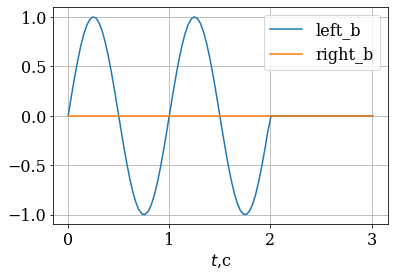

In [34]:
def T_l(t):
    t1 = 2
    if t <= t1:
        return np.sin(2*np.pi*t)
    else:
        return 0
    
def T_r(t):
    return 0

t = np.linspace(0,3.01,100)
plt.plot(t, [T_l(i) for i in t], label='left_b')
plt.plot(t, [T_r(i) for i in t], label='right_b')
plt.xlabel('$t$,c')
plt.legend()
plt.grid()

### Неоднородность скорости распределения волны по стержню

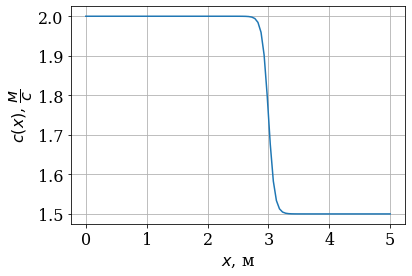

In [35]:
def Cs(x, c=2, eps=0.5, b0=3, delta=0.1):
    return c - eps*(1 + np.tanh((x - b0)/delta))/2.0

x = np.linspace(0,5,100)
plt.plot(x, Cs(x))
plt.xlabel('$x$, м')
plt.ylabel('$c(x)$, $\dfrac{м}{с}$')
plt.grid()

# Опишем численно решение задачи распространения возмущения  
исходное уравнение:  
$$ \dfrac{\partial}{\partial x} \Bigl(c^2(x) \dfrac{\partial U}{\partial x} \Bigr) = \dfrac{\partial^2 U}{\partial t^2}$$

In [25]:
def wave(u0, nt, dt, dx, cs):
    """
    u0 - ветор, содержащий начальный профиль амплитуд
    cs - воктор, содержащий значения скорости волны в промежуточных точках стержня
         (в полуцелых узлах, начиная с 1/2)
    """
    u_n = np.zeros((nt,len(u0))) #матрица, каждая строка которой будет содержать распределение 
                                 #амплитуды по стержню в каждый момент времени
    u_n[0,:] = u0.copy()
    u_n[1,:] = u0.copy() #т.к.начальный профиль скоростей полностью нулевой
    
    for t in np.arange(1,nt-1):
        # для промежуточных точек применяется схема центральных разностей
        u_n[t+1,1:-1] = 2*u_n[t,1:-1] - u_n[t-1,1:-1] + (dt/dx)**2 * (u_n[t,2:]*cs[1:]**2 + u_n[t,:-2]*cs[:-1]**2 - u_n[t,1:-1]*(cs[1:]**2 + cs[:-1]**2))
        # для граничных точек используются граничные условия
        u_n[t+1,0]  = Tleft(t*dt)
        u_n[t+1,-1] = Tright(t*dt)
    
    return u_n    

In [26]:
#параметры сетки
a, b = 0, 5
nx = 150
x = np.linspace(a,b,nx)
dx = x[1]-x[0]

#параметры задачи
eps = 0.4
delta = 0.1
b0 = 4
c = 1
cs = np.zeros(nx-1)
for i in range(nx-1):
    cs[i] = Cs((i+0.5)*dx, c=c, eps=eps, b0=b0, delta=delta)

#начальные условия
u0 = np.zeros_like(x)
u0[0] = Tleft(0)
u0[-1] = Tright(0)
u1 = np.zeros_like(x)

#параметры численной схемы
nt = 1000
Cu = 1
dt0 = Cu*dx/c
dt = dt0/(1+eps)
print("Исследуемый промежуток времени T =", dt*nt, "c")

u_n = wave(u0,nt,dt,dx,cs)

Исследуемый промежуток времени T = 23.969319271332694 c


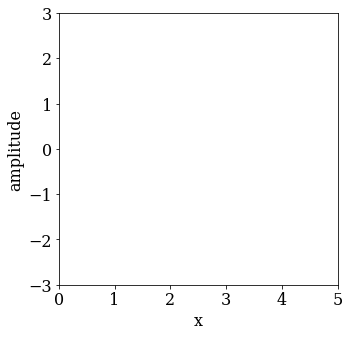

In [27]:
# в этой ячейке просто создаётся основа для анимации
fig = plt.figure(figsize=(5,5));
ax = plt.axes(xlim=(0,5),ylim=(-3,3),xlabel=('x'),ylabel=('amplitude'));
line, = ax.plot([],[],'-o',color='#003366', lw=2); #создали объект ЛИНИЯ, которой в функции animate подставляются данные

In [22]:
# функция для анимированного вывода
def animate(data):
    x = np.linspace(0,5,nx)
    y = data
    line.set_data(x,y)
    return line,

In [28]:
anim = animation.FuncAnimation(fig, animate, frames=u_n, interval=50)
HTML(anim.to_jshtml())

# Найдём коэффициент отражения  

Для начала поймаем моемент, когда из-за неоднородности появится отражённая волна 

shot#100, time = 2.3969319271332696


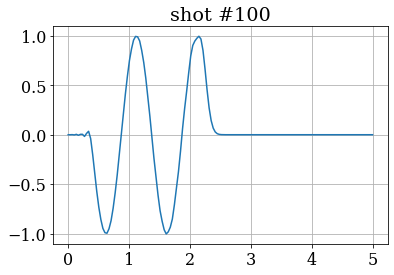

shot#120, time = 2.876318312559923


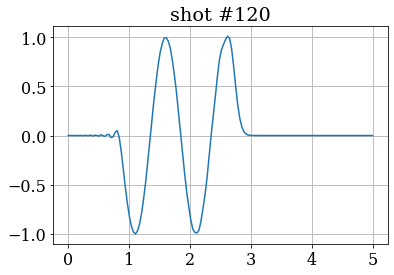

shot#140, time = 3.3557046979865772


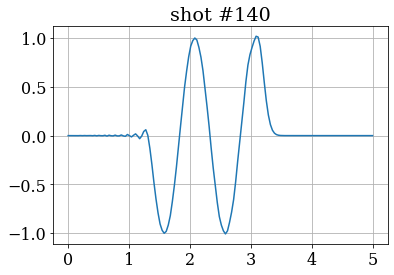

shot#160, time = 3.8350910834132312


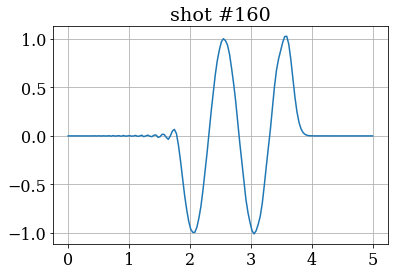

shot#180, time = 4.314477468839885


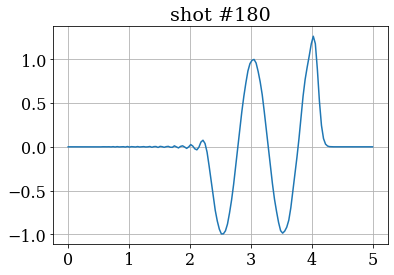

shot#200, time = 4.793863854266539


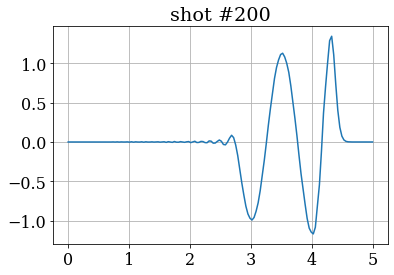

shot#220, time = 5.273250239693193


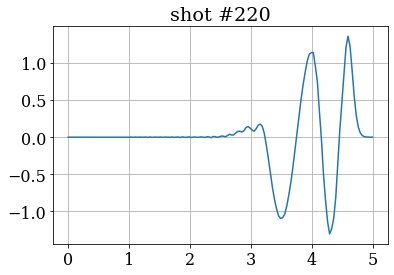

shot#240, time = 5.752636625119846


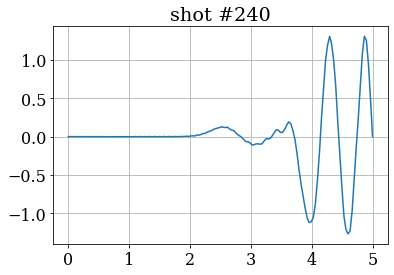

shot#260, time = 6.2320230105465


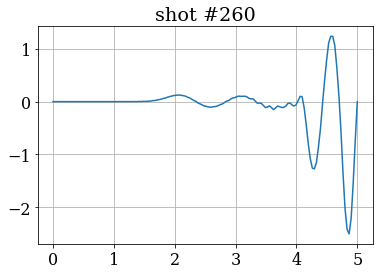

shot#280, time = 6.7114093959731544


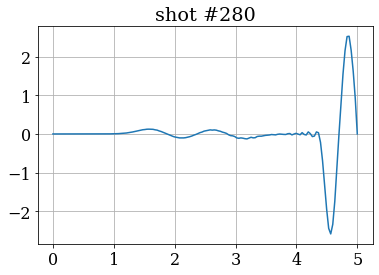

In [29]:
for shot in np.arange(100,285,20):
    print(f"shot#{shot}, time = {shot*dt}")

    plt.plot(x,u_n[shot])
    plt.title(f"shot #{shot}")
    plt.grid()
    plt.show()

Видно, что отражённую волну можно наблюдать примерно 260-290 кадрах. Рассмотрим детальнее

shot#260, time = 6.2320230105465


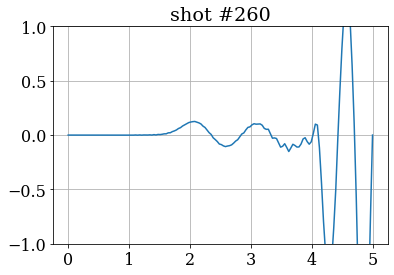

shot#261, time = 6.2559923298178335


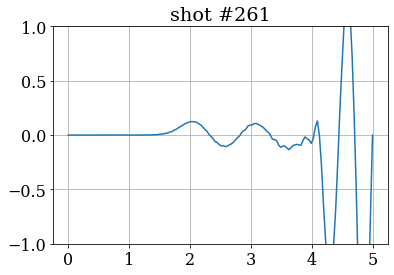

shot#262, time = 6.2799616490891665


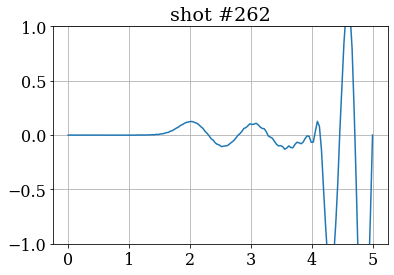

shot#263, time = 6.303930968360499


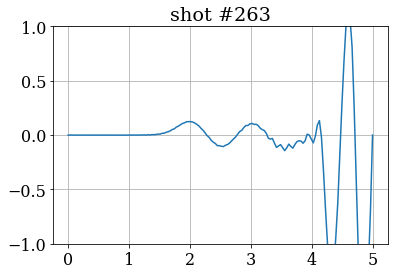

shot#264, time = 6.327900287631832


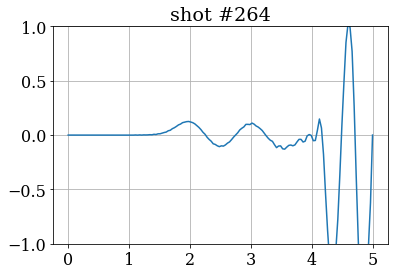

shot#265, time = 6.351869606903164


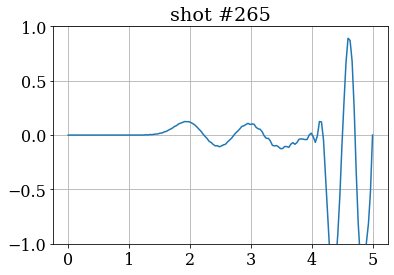

shot#266, time = 6.375838926174497


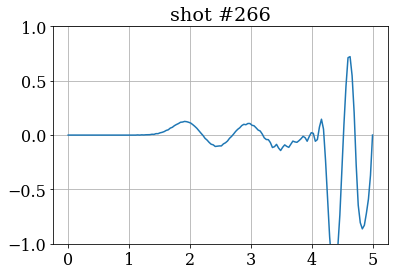

shot#267, time = 6.39980824544583


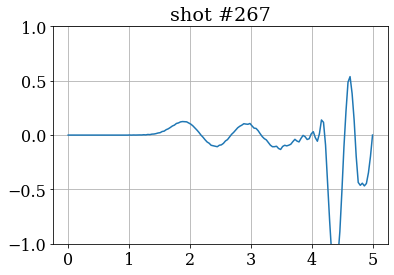

shot#268, time = 6.423777564717162


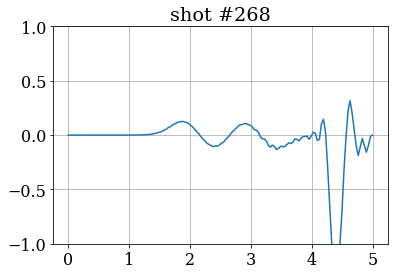

shot#269, time = 6.447746883988495


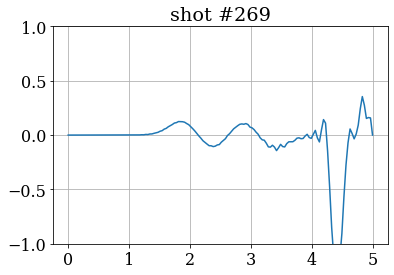

shot#270, time = 6.471716203259827


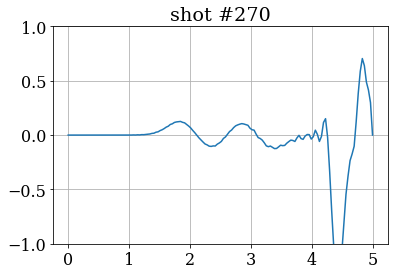

shot#271, time = 6.4956855225311605


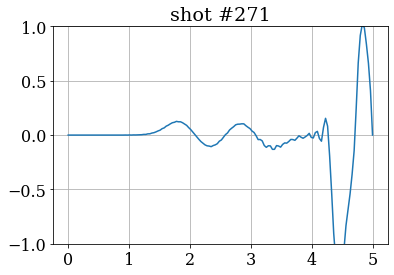

shot#272, time = 6.5196548418024936


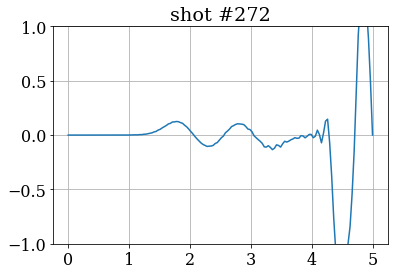

shot#273, time = 6.543624161073826


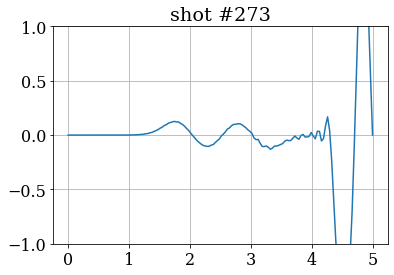

shot#274, time = 6.567593480345159


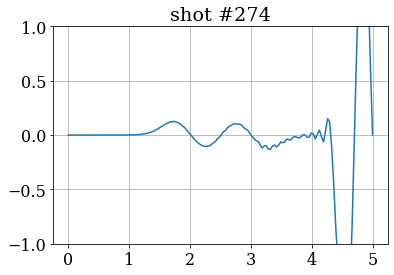

shot#275, time = 6.591562799616491


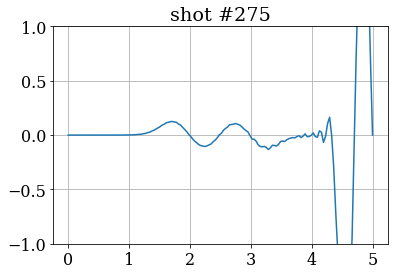

shot#276, time = 6.615532118887824


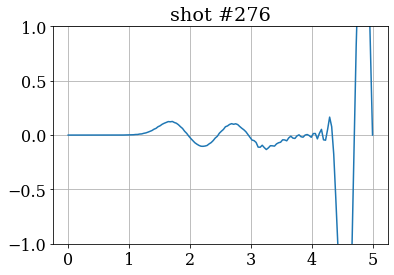

shot#277, time = 6.639501438159156


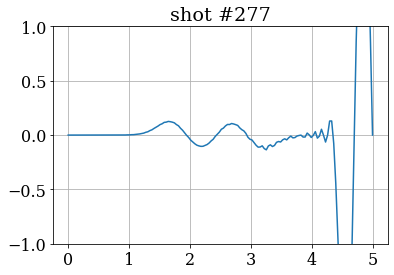

shot#278, time = 6.663470757430489


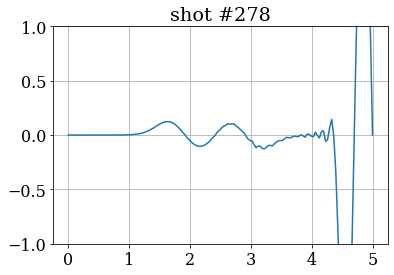

shot#279, time = 6.687440076701822


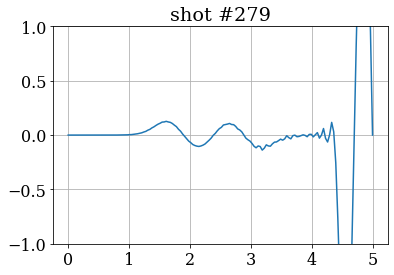

shot#280, time = 6.7114093959731544


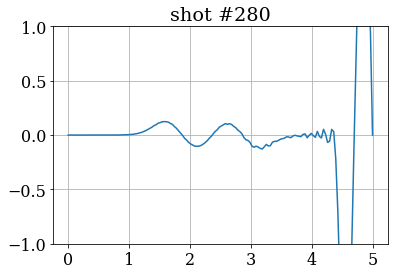

shot#281, time = 6.7353787152444875


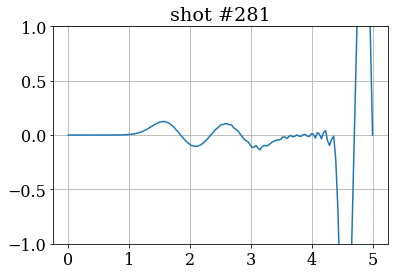

shot#282, time = 6.75934803451582


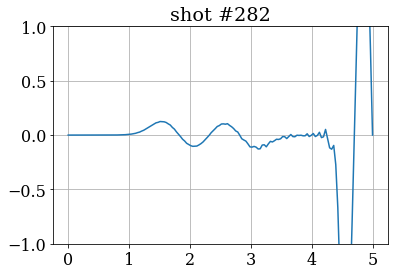

shot#283, time = 6.783317353787153


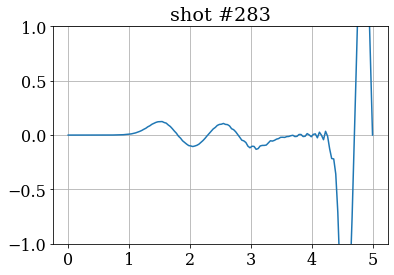

shot#284, time = 6.807286673058486


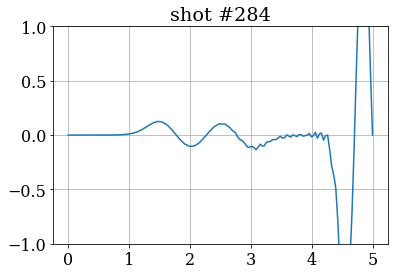

shot#285, time = 6.831255992329818


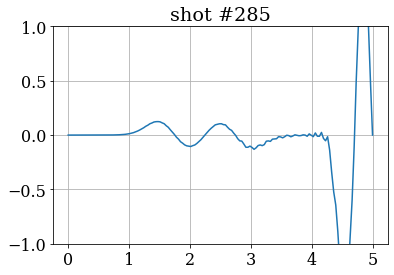

shot#286, time = 6.855225311601151


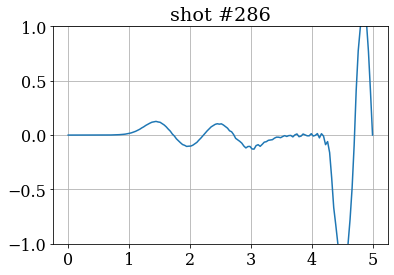

shot#287, time = 6.879194630872483


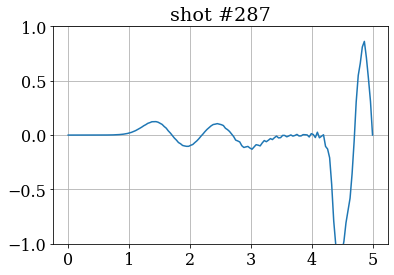

shot#288, time = 6.903163950143816


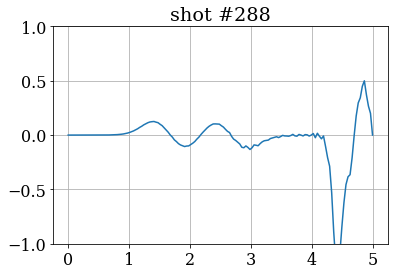

shot#289, time = 6.927133269415149


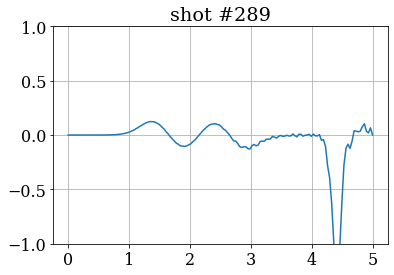

In [87]:
for shot in np.arange(260,290):
    print(f"shot#{shot}, time = {shot*dt}")

    plt.plot(x,u_n[shot])
    plt.title(f"shot #{shot}")
    plt.ylim(-1,1)
    plt.grid()
    plt.show()

В правой части графиоков видно поведение волны за неоднородностью - это нас не интересует.  

Коэффициент отражения равен отношению квадратов амплитуд изначанальной и отражённой волн.  
Для нахождения амплитуды отраженной волны будем искать первые локальные максимумы на предыдущих кадрах, и среди найденных максимумов найдём максимальный - его и обозначим за амлитуду отражённой волны.

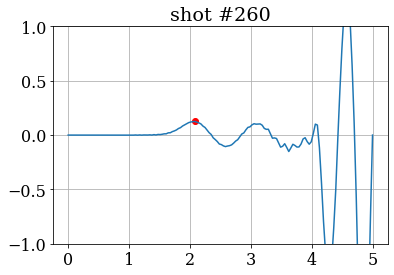

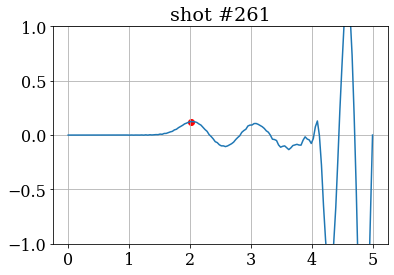

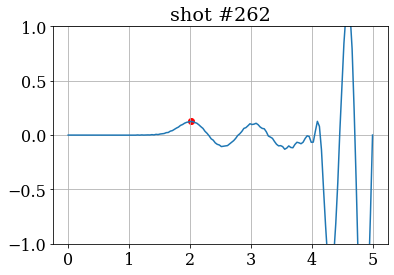

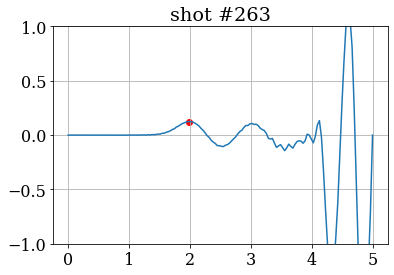

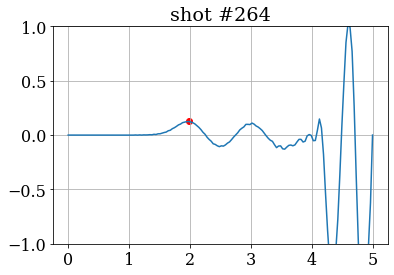

...

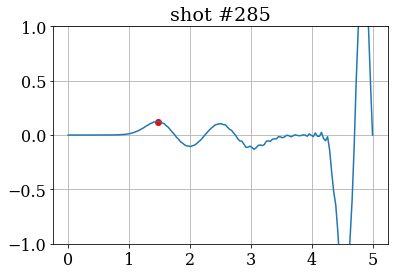

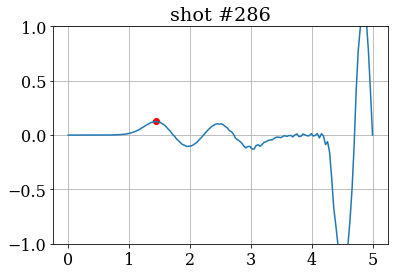

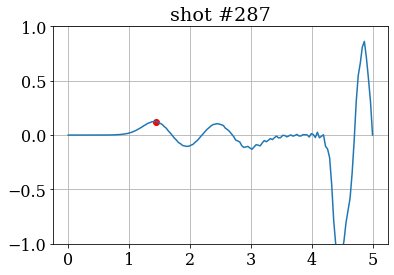

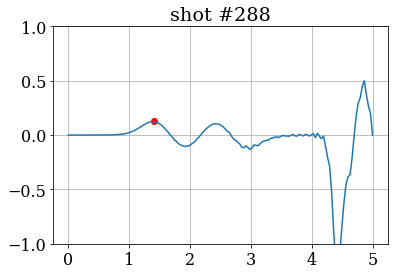

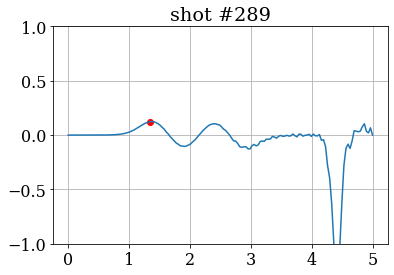

In [30]:
maxes = []
for shot in np.arange(260,290):
    m = np.max(u_n[shot,:nx*4//5])  # выберем первые четыре пятых точек - среди них должны быть только те,
                                    # которые относятся к отражённой волне
    ind = np.argmax(u_n[shot,:nx*4//5])
    maxes.append(m)
    
    plt.plot(x,u_n[shot])
    plt.scatter(x[ind],m,c='r') # отметит положение максимума на графике
    plt.title(f"shot #{shot}")
    plt.grid()
    plt.ylim(-1,1)
    plt.show()
maxes = np.array(maxes)

In [31]:
max_amplitude = np.max(maxes)
max_amplitude

0.126423916335121

Амплитуда исходной волны была равна 1, поэтому коэффициент отражения от неоднородности равен:

In [32]:
max_amplitude**2

0.015983006621509678